# <b>Assignment : DT</b>

# <font color='red'> <b>Task - 1</b></font>

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_essay (TFIDF) + Sentiment scores(preprocessed_essay)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_essay (TFIDF W2V) + Sentiment scores(preprocessed_essay)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 5, 10, 50], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum AUC value</li>
    <li>find the best hyper paramter using k-fold cross validation</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>Once after you found the best hyper parameter, we need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, we need to print the confusion matrix with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after we plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   

# <font color='red'><b> Task - 2 </b></font>

For this task consider **set-1** features.

*  Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM).
*  You need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  </li>
    <br>
You need to summarize the results at the end of the notebook, summarize it in the table format
    </li>
</ol>

<font color='red'><b> TF-IDFW2V</b></font>

<b>Tfidf w2v (w1,w2..) = (tfidf(w1) * w2v(w1) + tfidf(w2) * w2v(w2) + …)  /    (tfidf(w1) + tfidf(w2) + …)</b>

## Importing libaries

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore") 

import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import Normalizer
from sklearn.metrics import confusion_matrix

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

import pickle

from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from tqdm import tqdm

import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

[nltk_data] Downloading package vader_lexicon to C:\Users\Niket
[nltk_data]     Goriya\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


C:\Anaconda3\lib\site-packages\nltk\twitter\__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


<h1>1. Decision Tree </h1>

## 1.1 Loading Data

In [2]:
data = pd.read_csv('preprocessed_data.csv', nrows = 5000)

In [3]:
data.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05


In [4]:
X = data.drop('project_is_approved',axis=1)
Y = data['project_is_approved']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.20, random_state=42, stratify=Y)

print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)


(4000, 8) (4000,)
(1000, 8) (1000,)


## 1.3 Make data Model ready : Encoding Features - Essay

## TF-IDF

In [5]:
tfidf = TfidfVectorizer(min_df=10, max_features=5000)

In [6]:
Xtrn_essayTFIDF = tfidf.fit_transform(X_train['essay'].values)
Xtst_essayTFIDF = tfidf.transform(X_test['essay'].values)

print(Xtrn_essayTFIDF.shape, Y_train.shape)
print(Xtst_essayTFIDF.shape, Y_test.shape)

(4000, 4053) (4000,)
(1000, 4053) (1000,)


In [7]:
data.columns
# we can see that there is no feature as project title so its encoding is not needed

Index(['school_state', 'teacher_prefix', 'project_grade_category',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay', 'price'],
      dtype='object')

## TFIDF weighted W2V

In [8]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file

with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

### A. Weighted Word2Vec of train['essay']

In [9]:
TFIDFwtW2V = TfidfVectorizer()
TFIDFwtW2V.fit(X_train['essay'].values)

# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(TFIDFwtW2V.get_feature_names(), list(TFIDFwtW2V.idf_)))
tfidf_words = set(TFIDFwtW2V.get_feature_names())

In [10]:
# weighted Word2Vec
# compute average word2vec for each review.

Xtrn_essayTFIDFwtW2V = [];                     # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['essay'].values): # for each review/sentence
    vector = np.zeros(300)                     # as word vectors are of zero length
    tf_idf_weight =0;                          # num of words with a valid vector in the sentence/review
    
    for word in sentence.split():                            # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word]                                # getting the vector for each word
            
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf)           # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    
    Xtrn_essayTFIDFwtW2V.append(vector)

print(len(Xtrn_essayTFIDFwtW2V))
print(len(Xtrn_essayTFIDFwtW2V[0]))

100%|█████████████████████████████████████████████████████████████████████████████| 4000/4000 [00:07<00:00, 503.21it/s]

4000
300


### B. Weighted Word2Vec of test['essay']

In [11]:
# weighted Word2Vec
# compute average word2vec for each review.
Xtst_essayTFIDFwtW2V = [];                     # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['essay'].values):  # for each review/sentence
    vector = np.zeros(300)                     # as word vectors are of zero length
    tf_idf_weight =0;                          # num of words with a valid vector in the sentence/review
    for word in sentence.split():                             # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word]                                 # getting the vector for each word
            
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf)           # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    Xtst_essayTFIDFwtW2V.append(vector)

print(len(Xtst_essayTFIDFwtW2V))
print(len(Xtst_essayTFIDFwtW2V[0]))

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 520.55it/s]

1000
300


## Make Data Model Ready: Categorical Features

### Encoding Categorical Feature: school_state

In [12]:
cat_vec = CountVectorizer(binary = True)

In [13]:
XtrnSTATEohe = cat_vec.fit_transform(X_train['school_state'].values)
XtstSTATEohe = cat_vec.transform(X_test['school_state'].values)

print(XtrnSTATEohe.shape, Y_train.shape)
print(XtstSTATEohe.shape, Y_test.shape)

(4000, 51) (4000,)
(1000, 51) (1000,)


### Encoding Categorical Feature: teacher_prefix

In [14]:
XtrnTEACHER_PREFIXohe = cat_vec.fit_transform(X_train['teacher_prefix'].values)
XtstTEACHER_PREFIXohe = cat_vec.transform(X_test['teacher_prefix'].values)

print(XtrnTEACHER_PREFIXohe.shape, Y_train.shape)
print(XtstTEACHER_PREFIXohe.shape, Y_test.shape)

(4000, 4) (4000,)
(1000, 4) (1000,)


### Encoding Categorical Feature: project_grade_category

In [15]:
XtrnPROJ_CATohe = cat_vec.fit_transform(X_train['project_grade_category'].values)
XtstPROJ_CATohe = cat_vec.transform(X_test['project_grade_category'].values)

print(XtrnPROJ_CATohe.shape, Y_train.shape)
print(XtstPROJ_CATohe.shape, Y_test.shape)

(4000, 4) (4000,)
(1000, 4) (1000,)


### Encoding Categorical Feature: clean_categories

In [16]:
XtrnCLEAN_CATohe = cat_vec.fit_transform(X_train['clean_categories'].values)
XtstCLEAN_CATohe = cat_vec.transform(X_test['clean_categories'].values)

print(XtrnCLEAN_CATohe.shape, Y_train.shape)
print(XtstCLEAN_CATohe.shape, Y_test.shape)

(4000, 7) (4000,)
(1000, 7) (1000,)


### Encoding Categorical Feature: clean_subcategories

In [17]:
XtrnCLEAN_SUBCATohe = cat_vec.fit_transform(X_train['clean_subcategories'].values)
XtstCLEAN_SUBCATohe = cat_vec.transform(X_test['clean_subcategories'].values)

print(XtrnCLEAN_SUBCATohe.shape, Y_train.shape)
print(XtstCLEAN_SUBCATohe.shape, Y_test.shape)

(4000, 28) (4000,)
(1000, 28) (1000,)


## Make Data Model Ready: Numerical Features

### Encoding Numerical Feature: price

In [18]:
normalizer = Normalizer()

In [19]:
XtrnPRICEnorm = normalizer.fit_transform(X_train['price'].values.reshape(1,-1))
XtstPRICEnorm = normalizer.fit_transform(X_test['price'].values.reshape(1,-1))

XtrnPRICEnorm = XtrnPRICEnorm.reshape(-1,1)
XtstPRICEnorm = XtstPRICEnorm.reshape(-1,1)

print(XtrnPRICEnorm.shape, Y_train.shape)
print(XtstPRICEnorm.shape, Y_test.shape)

(4000, 1) (4000,)
(1000, 1) (1000,)


### Encoding Numerical Feature: teacher_number_of_previously_posted_projects

In [20]:
XtrnPRE_PROJnorm = normalizer.fit_transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
XtstPRE_PROJnorm = normalizer.fit_transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

XtrnPRE_PROJnorm = XtrnPRE_PROJnorm.reshape(-1,1)
XtstPRE_PROJnorm = XtstPRE_PROJnorm.reshape(-1,1)

print(XtrnPRE_PROJnorm.shape, Y_train.shape)
print(XtstPRE_PROJnorm.shape, Y_test.shape)

(4000, 1) (4000,)
(1000, 1) (1000,)


#   Concatinating All The Features

##### SET-1

* Set 1: categorical, numerical features + preprocessed_eassay (TFIDF)

In [21]:
from scipy.sparse import hstack

XtrnSET_TFIDF = hstack((Xtrn_essayTFIDF,XtrnSTATEohe,XtrnTEACHER_PREFIXohe,XtrnPROJ_CATohe,XtrnCLEAN_CATohe,XtrnCLEAN_SUBCATohe,XtrnPRICEnorm,XtrnPRE_PROJnorm)).tocsr()
XtstSET_TFIDF = hstack((Xtst_essayTFIDF,XtstSTATEohe,XtstTEACHER_PREFIXohe,XtstPROJ_CATohe,XtstCLEAN_CATohe,XtstCLEAN_SUBCATohe,XtstPRICEnorm,XtstPRE_PROJnorm)).tocsr()

print(XtrnSET_TFIDF.shape)
print(XtstSET_TFIDF.shape)

(4000, 4149)
(1000, 4149)


##### SET-2

* Set 2: categorical, numerical features + preprocessed_eassay (TFIDF_weighted_W2v)

In [22]:
XtrnSET_TFIDFwtW2v = hstack((Xtrn_essayTFIDFwtW2V,XtrnSTATEohe,XtrnTEACHER_PREFIXohe,XtrnPROJ_CATohe,XtrnCLEAN_CATohe,XtrnCLEAN_SUBCATohe,XtrnPRICEnorm,XtrnPRE_PROJnorm)).tocsr()
XtstSET_TFIDFwtW2v = hstack((Xtst_essayTFIDFwtW2V,XtstSTATEohe,XtstTEACHER_PREFIXohe,XtstPROJ_CATohe,XtstCLEAN_CATohe,XtstCLEAN_SUBCATohe,XtstPRICEnorm,XtstPRE_PROJnorm)).tocsr()

print(XtrnSET_TFIDFwtW2v.shape)
print(XtstSET_TFIDFwtW2v.shape)

(4000, 396)
(1000, 396)


# --------------------------------------------- (TASK - 1) --------------------------------------------------


# 1. Apply Decision Tree Classifier on SET - 1

In [24]:
maxdepth = [1, 5, 10, 50]
minsamples_split = [5, 10, 100, 500]

DT_params = {'max_depth': maxdepth,
             'min_samples_split': minsamples_split}

In [25]:
# with class_weights as balanced, i can see much difference false positive and fasle negative values

DT = DecisionTreeClassifier(class_weight = 'balanced')    
clf = GridSearchCV(DT, DT_params, cv=10, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(XtrnSET_TFIDF, Y_train)   #fitting

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(class_weight='balanced'),
             n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         'min_samples_split': [5, 10, 100, 500]},
             return_train_score=True, scoring='roc_auc')

In [26]:
# train test AUC

train_auc = clf.cv_results_['mean_train_score']
cv_auc = clf.cv_results_['mean_test_score']

In [27]:
# storing best values

bestscore1 = clf.best_score_
bestparams1 = clf.best_params_
bestscore1,bestparams1

(0.5906569481379413, {'max_depth': 10, 'min_samples_split': 500})

## 3D plot

In [28]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [29]:
from itertools import repeat

x1= maxdepth
y1= minsamples_split
z1= train_auc
z2= cv_auc

In [30]:
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
dataplt = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=dataplt, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

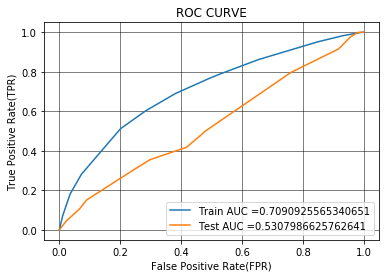

In [31]:
# Training with best parameters and plotting Train and Test AUC curve

bestDT = DecisionTreeClassifier(class_weight='balanced',max_depth = bestparams1['max_depth'],min_samples_split = bestparams1['min_samples_split'])
bestDT.fit(XtrnSET_TFIDF,Y_train)

Y_train_probs = clf.predict_proba(XtrnSET_TFIDF)[:,1] # converting train and test output into probability
Y_test_probs = clf.predict_proba(XtstSET_TFIDF)[:,1]

train_fpr, train_tpr, trn_thresholds = roc_curve(Y_train, Y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, tst_thresholds = roc_curve(Y_test, Y_test_probs)

plt.figure()
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

In [32]:
# Function for finding best Threshold values and prediction using best threshold values

def find_best_threshold(threshold, fpr, tpr):
    t = threshold[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshold):
    predictions = []
    for i in proba:
        if i>=threshold:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

the maximum value of tpr*(1-fpr) 0.4315694887856784 for threshold 0.522


[]

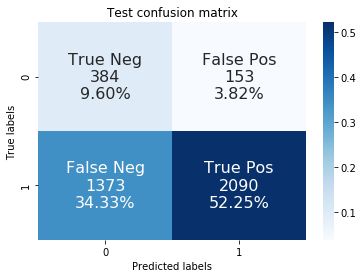

In [33]:
best_t = find_best_threshold(trn_thresholds, train_fpr, train_tpr)

# https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
# https://stackoverflow.com/questions/19233771/sklearn-plot-confusion-matrix-with-labels

cm = confusion_matrix(Y_train, predict_with_best_t(Y_train_probs, best_t))

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ['{0:0.0f}'.format(value) for value in cm.flatten()]

group_percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2,2)

cmplt = sns.heatmap(cm/np.sum(cm), annot=labels, fmt='', cmap='Blues',annot_kws = {"size":16})
cmplt.set_title("Train confusion matrix")
cmplt.set_xlabel('Predicted labels')
cmplt.set_ylabel('True labels') 
cmplt.plot()

the maximum value of tpr*(1-fpr) 0.2599875909137913 for threshold 0.383


[]

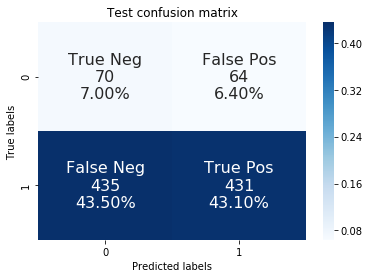

In [34]:
best_t = find_best_threshold(tst_thresholds, test_fpr, test_tpr)

# https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
# https://stackoverflow.com/questions/19233771/sklearn-plot-confusion-matrix-with-labels

cm = confusion_matrix(Y_test, predict_with_best_t(Y_test_probs, best_t))

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ['{0:0.0f}'.format(value) for value in cm.flatten()]

group_percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2,2)

cmplt = sns.heatmap(cm/np.sum(cm), annot=labels, fmt='', cmap='Blues',annot_kws = {"size":16})
cmplt.set_title("Test confusion matrix")
cmplt.set_xlabel('Predicted labels')
cmplt.set_ylabel('True labels') 
cmplt.plot()

In [35]:
predict=predict_with_best_t(Y_test_probs,best_t)

In [36]:
# to get false positive's respective essay values

FALSEposESSAY = []            # list to store all false positive essay values
for i in range(len(Y_test)):
    if(Y_test.values[i]==0) & (predict[i] == 1):
        FALSEposESSAY.append(X_test.values[i][-2])  

print(type(FALSEposESSAY[0]))
len(FALSEposESSAY)

<class 'str'>


64

### Printing Word Cloud

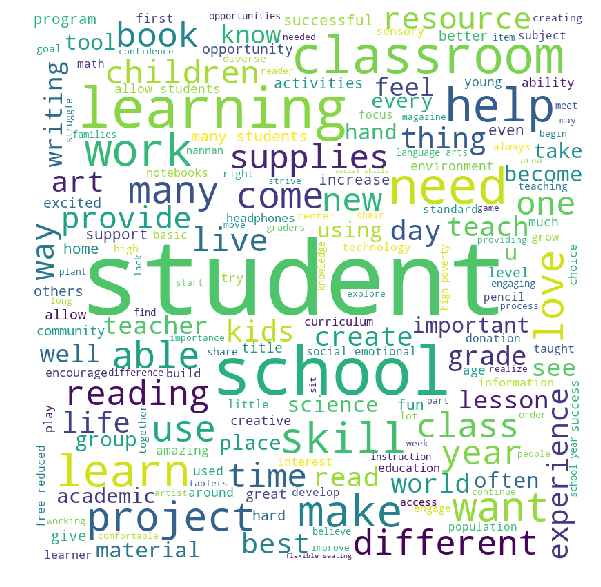

In [37]:
from wordcloud import WordCloud, STOPWORDS 

comment_words = ' '
stopwords = set(STOPWORDS) 

for essay in FALSEposESSAY: 
    
    tokens = essay.split()   
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower()      
    for word in tokens: 
        comment_words = comment_words + word + ' '
  
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

64


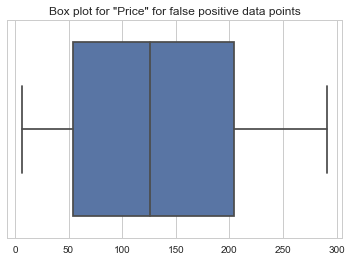

In [38]:
# Getting false positive's respective values of price

FALSEposPRICE = []
for i in range(len(Y_test)):
    if Y_test.values[i]==0 and predict[i]==1:
        FALSEposPRICE.append(X_test.values[i][-1])

print(len(FALSEposPRICE))

sns.set(style="whitegrid")
sns.boxplot(FALSEposPRICE)
plt.title('Box plot for "Price" for false positive data points')
plt.show()

64


C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



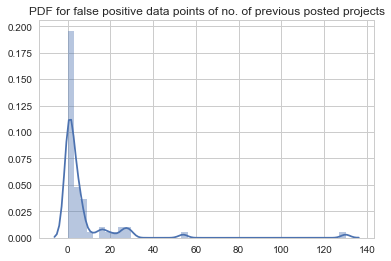

In [39]:
# PDF of False positive values of previous number of project submissions

FALSEposPRE_PROJ = []
for i in range(len(Y_test)):
    if Y_test.values[i]==0 and predict[i]==1:
        FALSEposPRE_PROJ.append(X_test.values[i][3])

print(len(FALSEposPRE_PROJ))

sns.distplot(FALSEposPRE_PROJ)
plt.title('PDF for false positive data points of no. of previous posted projects')
plt.show()

# 2. Apply Decision Tree Classifier on SET - 2

In [40]:
maxdepth = [1, 5, 10, 50]
minsamples_split = [5, 10, 100, 500]

DT_params = {'max_depth': maxdepth,
             'min_samples_split': minsamples_split}

In [41]:
DT = DecisionTreeClassifier(class_weight = 'balanced')
clf = GridSearchCV(DT, DT_params, cv=10, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(XtrnSET_TFIDFwtW2v, Y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(class_weight='balanced'),
             n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         'min_samples_split': [5, 10, 100, 500]},
             return_train_score=True, scoring='roc_auc')

In [42]:
# getting Train and Test ACU-scores

train_auc = clf.cv_results_['mean_train_score']
cv_auc = clf.cv_results_['mean_test_score']

In [43]:
# storing best values

bestscore2 = clf.best_score_
bestparams2 = clf.best_params_
bestscore2,bestparams2

(0.5739370679330238, {'max_depth': 50, 'min_samples_split': 500})

### 3-D plot

In [44]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [45]:
from itertools import repeat

x1= maxdepth
y1= minsamples_split
z1= train_auc
z2= cv_auc

In [46]:
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
dataplt = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=dataplt, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

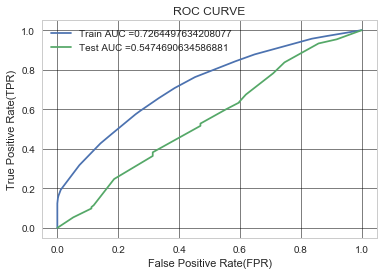

In [47]:
# Training with best parameters and plotting Train and Test AUC curve

bestDT = DecisionTreeClassifier(class_weight='balanced',max_depth = bestparams2['max_depth'],min_samples_split = bestparams2['min_samples_split'])
bestDT.fit(XtrnSET_TFIDFwtW2v,Y_train)

Y_train_probs = clf.predict_proba(XtrnSET_TFIDFwtW2v)[:,1] # converting train and test output into probability
Y_test_probs = clf.predict_proba(XtstSET_TFIDFwtW2v)[:,1]

train_fpr, train_tpr, trn_thresholds = roc_curve(Y_train, Y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, tst_thresholds = roc_curve(Y_test, Y_test_probs)

plt.figure()
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

In [48]:
# Function for finding best Threshold values and prediction using best threshold values

def find_best_threshold(threshold, fpr, tpr):
    t = threshold[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshold):
    predictions = []
    for i in proba:
        if i>=threshold:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

the maximum value of tpr*(1-fpr) 0.43757820771970357 for threshold 0.514


[]

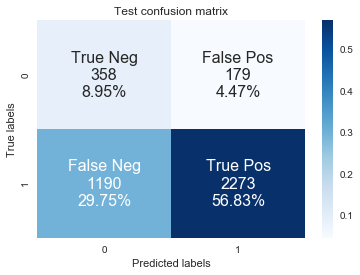

In [49]:
best_t = find_best_threshold(trn_thresholds, train_fpr, train_tpr)

cm = metrics.confusion_matrix(Y_train,predict_with_best_t(Y_train_probs, best_t))

# https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
# https://stackoverflow.com/questions/19233771/sklearn-plot-confusion-matrix-with-labels

#cm = confusion_matrix(Y_train, predict_with_best_t(Y_train_probs, best_t))

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ['{0:0.0f}'.format(value) for value in cm.flatten()]

group_percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2,2)

cmplt = sns.heatmap(cm/np.sum(cm), annot=labels, fmt='', cmap='Blues',annot_kws = {"size":16})
cmplt.set_title("Test confusion matrix")
cmplt.set_xlabel('Predicted labels')
cmplt.set_ylabel('True labels') 
cmplt.plot()

the maximum value of tpr*(1-fpr) 0.2796094584812657 for threshold 0.529


[]

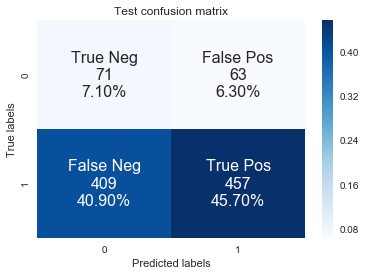

In [50]:
best_t = find_best_threshold(tst_thresholds, test_fpr, test_tpr)

# https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
# https://stackoverflow.com/questions/19233771/sklearn-plot-confusion-matrix-with-labels

cm = confusion_matrix(Y_test, predict_with_best_t(Y_test_probs, best_t))

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ['{0:0.0f}'.format(value) for value in cm.flatten()]

group_percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2,2)

cmplt = sns.heatmap(cm/np.sum(cm), annot=labels, fmt='', cmap='Blues',annot_kws = {"size":16})
cmplt.set_title("Test confusion matrix")
cmplt.set_xlabel('Predicted labels')
cmplt.set_ylabel('True labels') 
cmplt.plot()

In [51]:
predict=predict_with_best_t(Y_test_probs,best_t)

In [52]:
# to get false positive's respective essay values

FALSEposESSAY = []            # list to store all false positive essay values
for i in range(len(Y_test)):
    if(Y_test.values[i]==0) & (predict[i] == 1):
        FALSEposESSAY.append(X_test.values[i][-2])  

print(type(FALSEposESSAY[0]))
len(FALSEposESSAY)

<class 'str'>


63

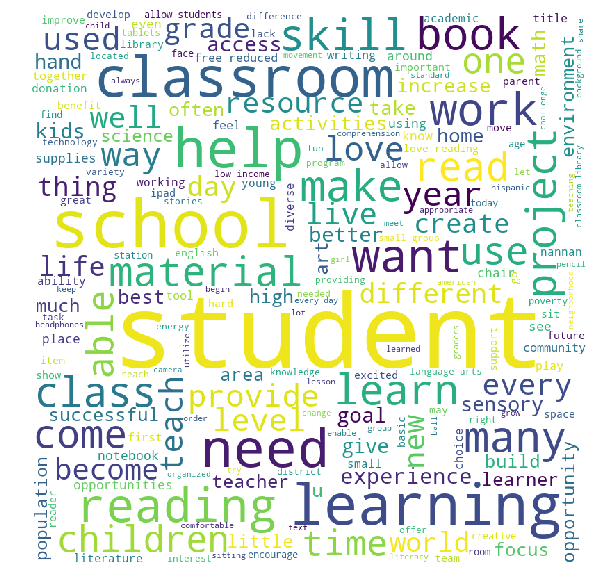

In [53]:
from wordcloud import WordCloud, STOPWORDS 

comment_words = ' '
stopwords = set(STOPWORDS) 

for essay in FALSEposESSAY: 
    
    tokens = essay.split()   
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower()      
    for word in tokens: 
        comment_words = comment_words + word + ' '
  
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

63


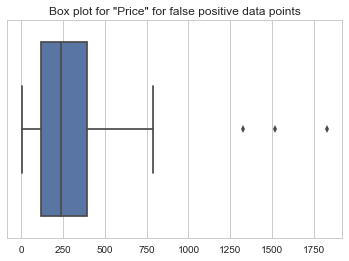

In [54]:
# Getting false positive's respective values of price

FALSEposPRICE = []
for i in range(len(Y_test)):
    if Y_test.values[i]==0 and predict[i]==1:
        FALSEposPRICE.append(X_test.values[i][-1])

print(len(FALSEposPRICE))

sns.set(style="whitegrid")
sns.boxplot(FALSEposPRICE)
plt.title('Box plot for "Price" for false positive data points')
plt.show()

63


C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



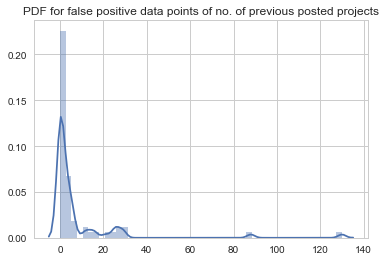

In [55]:
# PDF of False positive values of previous number of project submissions

FALSEposPRE_PROJ = []
for i in range(len(Y_test)):
    if Y_test.values[i]==0 and predict[i]==1:
        FALSEposPRE_PROJ.append(X_test.values[i][3])

print(len(FALSEposPRE_PROJ))

sns.distplot(FALSEposPRE_PROJ)
plt.title('PDF for false positive data points of no. of previous posted projects')
plt.show()

#  <font color='red'><b> Task - 2 </b></font>  -----------------------------------------------------------------------------------------

In [56]:
# Desision Tree with Max Depth as none and min_samples_split fixing at 500

DT = DecisionTreeClassifier(class_weight='balanced',min_samples_split=500) 

DT.fit(XtrnSET_TFIDF, Y_train)

DecisionTreeClassifier(class_weight='balanced', min_samples_split=500)

In [57]:
# getting all non-zero features
# https://stackoverflow.com/questions/63334393/how-to-filter-non-zero-importance-features-from-sparse-matrix

XtrnNEWft = XtrnSET_TFIDF.todense()[:,DT.feature_importances_>0]
XtstNEWft = XtstSET_TFIDF.todense()[:,DT.feature_importances_>0]

In [58]:
XtrnNEWft.shape,XtstNEWft.shape

((4000, 14), (1000, 14))

In [59]:
maxdepth = [1, 5, 10, 50]
minsamples_split = [5, 10, 100, 500]

DT_params = {'max_depth': maxdepth,
             'min_samples_split': minsamples_split}

In [60]:
DT = DecisionTreeClassifier(class_weight = 'balanced')
clf = GridSearchCV(DT, DT_params, cv=10, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(XtrnNEWft, Y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(class_weight='balanced'),
             n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         'min_samples_split': [5, 10, 100, 500]},
             return_train_score=True, scoring='roc_auc')

In [61]:
train_auc = clf.cv_results_['mean_train_score']
train_auc_std = clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std = clf.cv_results_['std_test_score']

In [62]:
bestscore3 = clf.best_score_
bestparams3 = clf.best_params_
bestscore3,bestparams3

(0.6430503817786388, {'max_depth': 50, 'min_samples_split': 500})

In [63]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [64]:
from itertools import repeat

x1= maxdepth
y1= minsamples_split
z1= train_auc
z2= cv_auc

In [65]:
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
dataplt = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=dataplt, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

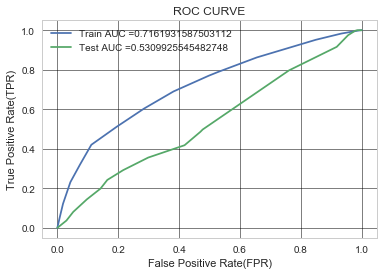

In [66]:
# training with best params and plotting Test and Train AUC curves

bestDT = DecisionTreeClassifier(class_weight='balanced',max_depth = bestparams3['max_depth'],min_samples_split = bestparams3['min_samples_split'])
bestDT.fit(XtrnNEWft,Y_train)

Y_train_probs = clf.predict_proba(XtrnNEWft)[:,1] # converting train and test output into probability
Y_test_probs = clf.predict_proba(XtstNEWft)[:,1]

train_fpr, train_tpr, trn_thresholds = roc_curve(Y_train, Y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, tst_thresholds = roc_curve(Y_test, Y_test_probs)

plt.figure()
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

In [67]:
def find_best_threshold(threshold, fpr, tpr):
    t = threshold[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshold):
    predictions = []
    for i in proba:
        if i>=threshold:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

the maximum value of tpr*(1-fpr) 0.4315694887856784 for threshold 0.506


[]

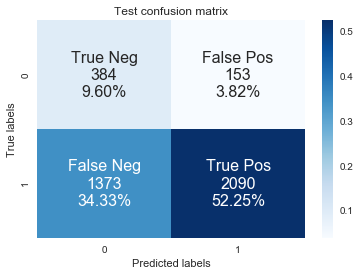

In [68]:
best_t = find_best_threshold(trn_thresholds, train_fpr, train_tpr)
cm = metrics.confusion_matrix(Y_train,predict_with_best_t(Y_train_probs, best_t))

# https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
# https://stackoverflow.com/questions/19233771/sklearn-plot-confusion-matrix-with-labels

#cm = confusion_matrix(Y_train, predict_with_best_t(Y_train_probs, best_t))

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ['{0:0.0f}'.format(value) for value in cm.flatten()]

group_percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2,2)

cmplt = sns.heatmap(cm/np.sum(cm), annot=labels, fmt='', cmap='Blues',annot_kws = {"size":16})
cmplt.set_title("Test confusion matrix")
cmplt.set_xlabel('Predicted labels')
cmplt.set_ylabel('True labels') 
cmplt.plot()

the maximum value of tpr*(1-fpr) 0.2599875909137913 for threshold 0.383


[]

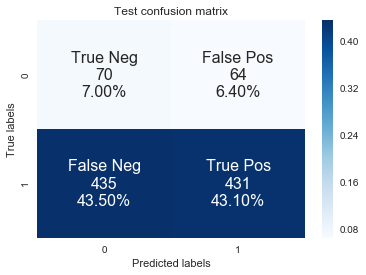

In [69]:
best_t = find_best_threshold(tst_thresholds, test_fpr, test_tpr)

# https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
# https://stackoverflow.com/questions/19233771/sklearn-plot-confusion-matrix-with-labels

cm = confusion_matrix(Y_test, predict_with_best_t(Y_test_probs, best_t))

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ['{0:0.0f}'.format(value) for value in cm.flatten()]

group_percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2,2)

cmplt = sns.heatmap(cm/np.sum(cm), annot=labels, fmt='', cmap='Blues',annot_kws = {"size":16})
cmplt.set_title("Test confusion matrix")
cmplt.set_xlabel('Predicted labels')
cmplt.set_ylabel('True labels') 
cmplt.plot()

In [70]:
predict=predict_with_best_t(Y_test_probs,best_t)

In [71]:
# to get false positive's respective essay values

FALSEposESSAY = []            # list to store all false positive essay values
for i in range(len(Y_test)):
    if(Y_test.values[i]==0) & (predict[i] == 1):
        FALSEposESSAY.append(X_test.values[i][-2])  

print(type(FALSEposESSAY[0]))
len(FALSEposESSAY)

<class 'str'>


64

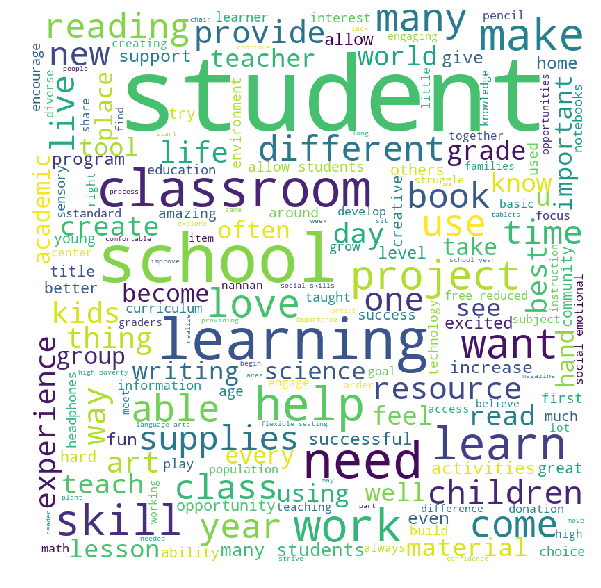

In [72]:
from wordcloud import WordCloud, STOPWORDS 

comment_words = ' '
stopwords = set(STOPWORDS) 

for essay in FALSEposESSAY: 
    
    tokens = essay.split()   
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower()      
    for word in tokens: 
        comment_words = comment_words + word + ' '
  
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

64


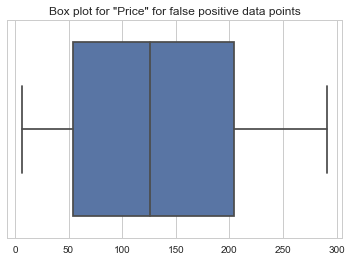

In [73]:
import seaborn as sns

FALSEposPRICE = []
for i in range(len(Y_test)):
    if Y_test.values[i]==0 and predict[i]==1:
        FALSEposPRICE.append(X_test.values[i][-1])

print(len(FALSEposPRICE))

sns.set(style="whitegrid")
sns.boxplot(FALSEposPRICE)
plt.title('Box plot for "Price" for false positive data points')
plt.show()

64


C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



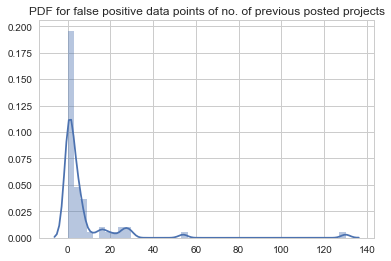

In [74]:
import seaborn as sns

FALSEposPRE_PROJ = []
for i in range(len(Y_test)):
    if Y_test.values[i]==0 and predict[i]==1:
        FALSEposPRE_PROJ.append(X_test.values[i][3])

print(len(FALSEposPRE_PROJ))

sns.distplot(FALSEposPRE_PROJ)
plt.title('PDF for false positive data points of no. of previous posted projects')
plt.show()

# Decision Trees with TFIDF and Sentiment

In [75]:
sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm \
for learning my students learn in many different ways using all of our senses and multiple intelligences i use a wide range\
of techniques to help all my students succeed students in my class come from a variety of different backgrounds which makes\
for wonderful sharing of experiences and cultures including native americans our school is a caring community of successful \
learners which can be seen through collaborative student project based learning in and out of the classroom kindergarteners \
in my class love to work with hands on materials and have many different opportunities to practice a skill before it is\
mastered having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum\
montana is the perfect place to learn about agriculture and nutrition my students love to role play in our pretend kitchen\
in the early childhood classroom i have had several kids ask me can we try cooking with real food i will take their idea \
and create common core cooking lessons where we learn important math and writing concepts while cooking delicious healthy \
food for snack time my students will have a grounded appreciation for the work that went into making the food and knowledge \
of where the ingredients came from as well as how it is healthy for their bodies this project would expand our learning of \
nutrition and agricultural cooking recipes by having us peel our own apples to make homemade applesauce make our own bread \
and mix up healthy plants from our classroom garden in the spring we will also create our own cookbooks to be printed and \
shared with families students will gain math and literature skills as well as a life long enjoyment for healthy cooking \
nannan'
ss = sid.polarity_scores(for_sentiment)

for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

neg: 0.01, neu: 0.745, pos: 0.245, compound: 0.9975, 

In [76]:
txt_senti = data.copy()
senti = txt_senti['essay']

In [77]:
txt_senti.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05


In [78]:
negative = []
neutral = []
positive  = []
compound = []

for i in tqdm(senti):
    negative.append(sid.polarity_scores(i)['neg'])
    neutral.append(sid.polarity_scores(i)['neu'])
    positive.append(sid.polarity_scores(i)['pos'])
    compound.append(sid.polarity_scores(i)['compound'])


100%|█████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:34<00:00, 143.81it/s]


In [79]:
# adding new features to dataset based on  Sentiment Intensity Analyzer

txt_senti["negative"] = negative
txt_senti["neutral"] = neutral        
txt_senti["positive"] = positive
txt_senti["compound"] = compound

In [80]:
txt_senti.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,negative,neutral,positive,compound
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,0.013,0.783,0.205,0.9867


In [81]:
X = txt_senti.drop('project_is_approved',axis=1)
Y = txt_senti['project_is_approved']

X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.20, random_state=42, stratify=Y)

print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)


(4000, 12) (4000,)
(1000, 12) (1000,)


In [82]:
normalizer = Normalizer()

In [83]:
XtrnNEGnorm = normalizer.fit_transform(X_train['negative'].values.reshape(1,-1))
XtstNEGnorm = normalizer.fit_transform(X_test['negative'].values.reshape(1,-1))

XtrnNEUnorm = normalizer.fit_transform(X_train['neutral'].values.reshape(1,-1))
XtstNEUnorm = normalizer.fit_transform(X_test['neutral'].values.reshape(1,-1)) 

XtrnPOSnorm = normalizer.fit_transform(X_train['positive'].values.reshape(1,-1))
XtstPOSnorm = normalizer.fit_transform(X_test['positive'].values.reshape(1,-1))

XtrnCMPNDnorm = normalizer.fit_transform(X_train['compound'].values.reshape(1,-1))
XtstCMPNDnorm = normalizer.fit_transform(X_test['compound'].values.reshape(1,-1))

XtrnNEGnorm = XtrnNEGnorm.reshape(-1,1)
XtstNEGnorm = XtstNEGnorm.reshape(-1,1)

XtrnNEUnorm = XtrnNEUnorm.reshape(-1,1)
XtstNEUnorm = XtstNEUnorm.reshape(-1,1)

XtrnPOSnorm = XtrnPOSnorm.reshape(-1,1)
XtstPOSnorm = XtstPOSnorm.reshape(-1,1)

XtrnCMPNDnorm = XtrnCMPNDnorm.reshape(-1,1)
XtstCMPNDnorm = XtstCMPNDnorm.reshape(-1,1)

print(XtrnNEGnorm.shape, Y_train.shape)
print(XtstNEGnorm.shape, Y_test.shape)

print(XtrnNEUnorm.shape, Y_train.shape)
print(XtstNEUnorm.shape, Y_test.shape)

print(XtrnPOSnorm.shape, Y_train.shape)
print(XtstPOSnorm.shape, Y_test.shape)

print(XtrnCMPNDnorm.shape, Y_train.shape)
print(XtstCMPNDnorm.shape, Y_test.shape)

(4000, 1) (4000,)
(1000, 1) (1000,)
(4000, 1) (4000,)
(1000, 1) (1000,)
(4000, 1) (4000,)
(1000, 1) (1000,)
(4000, 1) (4000,)
(1000, 1) (1000,)


#   Concatinating All The Features

##### SET-1

* Set 1: categorical, numerical features + preprocessed_eassay (TFIDF) + Sentiment

In [84]:
from scipy.sparse import hstack

XtrnSET_TFIDF_SENTI = hstack((Xtrn_essayTFIDF,XtrnSTATEohe,XtrnTEACHER_PREFIXohe,XtrnPROJ_CATohe,XtrnCLEAN_CATohe,XtrnCLEAN_SUBCATohe,XtrnPRICEnorm,XtrnPRE_PROJnorm,XtrnNEGnorm,XtrnNEUnorm,XtrnPOSnorm,XtrnCMPNDnorm)).tocsr()
XtstSET_TFIDF_SENTI = hstack((Xtst_essayTFIDF,XtstSTATEohe,XtstTEACHER_PREFIXohe,XtstPROJ_CATohe,XtstCLEAN_CATohe,XtstCLEAN_SUBCATohe,XtstPRICEnorm,XtstPRE_PROJnorm,XtstNEGnorm,XtstNEUnorm,XtstPOSnorm,XtstCMPNDnorm)).tocsr()

print(XtrnSET_TFIDF_SENTI.shape)
print(XtstSET_TFIDF_SENTI.shape)

(4000, 4153)
(1000, 4153)


In [85]:
maxdepth = [1, 5, 10, 50]
minsamples_split = [5, 10, 100, 500]

DT_params = {'max_depth': maxdepth,
             'min_samples_split': minsamples_split}

In [86]:
# with class_weights as balanced, i can see much difference false positive and fasle negative values

DT = DecisionTreeClassifier(class_weight = 'balanced')    
clf = GridSearchCV(DT, DT_params, cv=10, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(XtrnSET_TFIDF_SENTI, Y_train)   #fitting

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(class_weight='balanced'),
             n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         'min_samples_split': [5, 10, 100, 500]},
             return_train_score=True, scoring='roc_auc')

In [87]:
# train test AUC

train_auc = clf.cv_results_['mean_train_score']
cv_auc = clf.cv_results_['mean_test_score']

In [88]:
# storing best values

bestscore4 = clf.best_score_
bestparams4 = clf.best_params_
bestscore4,bestparams4

(0.5924256608753542, {'max_depth': 10, 'min_samples_split': 500})

## 3D plot

In [89]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [90]:
from itertools import repeat

x1= maxdepth
y1= minsamples_split
z1= train_auc
z2= cv_auc

In [91]:
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
dataplt = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=dataplt, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

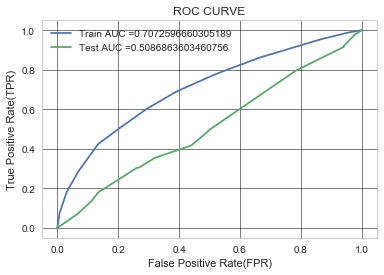

In [92]:
# Training with best parameters and plotting Train and Test AUC curve

bestDT = DecisionTreeClassifier(class_weight='balanced',max_depth = bestparams4['max_depth'],min_samples_split = bestparams4['min_samples_split'])
bestDT.fit(XtrnSET_TFIDF_SENTI,Y_train)

Y_train_probs = clf.predict_proba(XtrnSET_TFIDF_SENTI)[:,1] # converting train and test output into probability
Y_test_probs = clf.predict_proba(XtstSET_TFIDF_SENTI)[:,1]

train_fpr, train_tpr, trn_thresholds = roc_curve(Y_train, Y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, tst_thresholds = roc_curve(Y_test, Y_test_probs)

plt.figure()
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

In [93]:
# Function for finding best Threshold values and prediction using best threshold values

def find_best_threshold(threshold, fpr, tpr):
    t = threshold[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshold):
    predictions = []
    for i in proba:
        if i>=threshold:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

the maximum value of tpr*(1-fpr) 0.42533868278169157 for threshold 0.522


[]

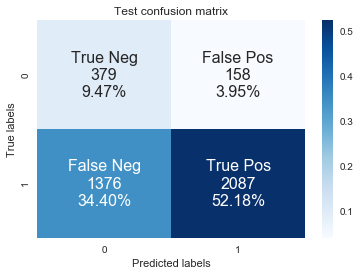

In [94]:
best_t = find_best_threshold(trn_thresholds, train_fpr, train_tpr)

# https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
# https://stackoverflow.com/questions/19233771/sklearn-plot-confusion-matrix-with-labels

cm = confusion_matrix(Y_train, predict_with_best_t(Y_train_probs, best_t))

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ['{0:0.0f}'.format(value) for value in cm.flatten()]

group_percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2,2)

cmplt = sns.heatmap(cm/np.sum(cm), annot=labels, fmt='', cmap='Blues',annot_kws = {"size":16})
cmplt.set_title("Test confusion matrix")
cmplt.set_xlabel('Predicted labels')
cmplt.set_ylabel('True labels') 
cmplt.plot()

the maximum value of tpr*(1-fpr) 0.24826789838337182 for threshold 0.383


[]

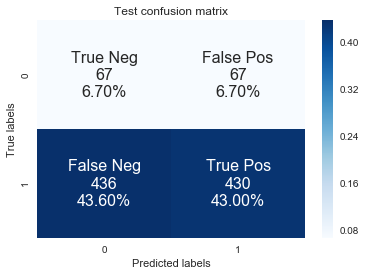

In [95]:
best_t = find_best_threshold(tst_thresholds, test_fpr, test_tpr)

# https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
# https://stackoverflow.com/questions/19233771/sklearn-plot-confusion-matrix-with-labels

cm = confusion_matrix(Y_test, predict_with_best_t(Y_test_probs, best_t))

group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ['{0:0.0f}'.format(value) for value in cm.flatten()]

group_percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2,2)

cmplt = sns.heatmap(cm/np.sum(cm), annot=labels, fmt='', cmap='Blues',annot_kws = {"size":16})
cmplt.set_title("Test confusion matrix")
cmplt.set_xlabel('Predicted labels')
cmplt.set_ylabel('True labels') 
cmplt.plot()

In [96]:
predict=predict_with_best_t(Y_test_probs,best_t)

In [97]:
# to get false positive's respective essay values

FALSEposESSAY = []            # list to store all false positive essay values
for i in range(len(Y_test)):
    if(Y_test.values[i]==0) & (predict[i] == 1):
        FALSEposESSAY.append(X_test.values[i][-6])  

print(type(FALSEposESSAY[0]))
len(FALSEposESSAY)

<class 'str'>


67

### Printing Word Cloud

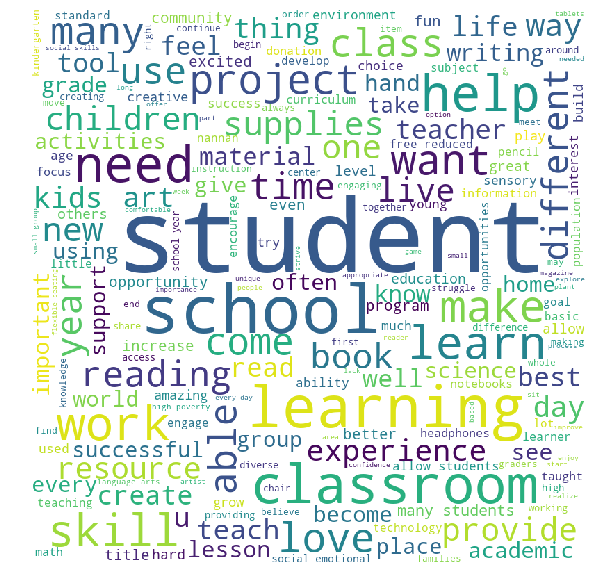

In [98]:
from wordcloud import WordCloud, STOPWORDS 

comment_words = ' '
stopwords = set(STOPWORDS) 

for essay in FALSEposESSAY: 
    
    tokens = essay.split()   
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower()      
    for word in tokens: 
        comment_words = comment_words + word + ' '
  
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

67


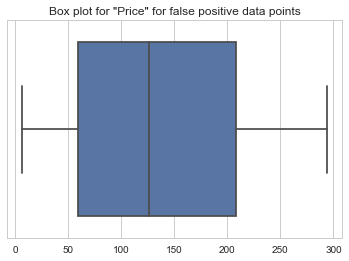

In [99]:
# Getting false positive's respective values of price

FALSEposPRICE = []
for i in range(len(Y_test)):
    if Y_test.values[i]==0 and predict[i]==1:
        FALSEposPRICE.append(X_test.values[i][-5])

print(len(FALSEposPRICE))

sns.set(style="whitegrid")
sns.boxplot(FALSEposPRICE)
plt.title('Box plot for "Price" for false positive data points')
plt.show()

67


C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



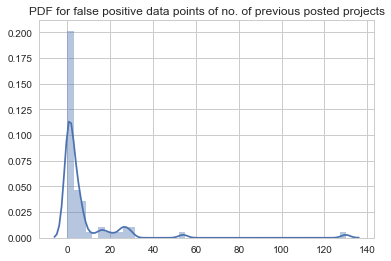

In [100]:
# PDF of False positive values of previous number of project submissions

FALSEposPRE_PROJ = []
for i in range(len(Y_test)):
    if Y_test.values[i]==0 and predict[i]==1:
        FALSEposPRE_PROJ.append(X_test.values[i][3])

print(len(FALSEposPRE_PROJ))

sns.distplot(FALSEposPRE_PROJ)
plt.title('PDF for false positive data points of no. of previous posted projects')
plt.show()

In [101]:
from prettytable import PrettyTable

table = PrettyTable()
table.field_names = ['No.','Vectorizer',              'Model',         'Hyperparameter', 'Test-AUC' ]
table.add_row(      [1,    'TFIDF',                   'Decision Tree',  bestparams1,      bestscore1])
table.add_row(      [2,    'TFIDFwtW2v',              'Decision Tree',  bestparams2,      bestscore2])
table.add_row(      [3,    'TFIDF(non_zero_features)','Decision Tree',  bestparams3,      bestscore3])
table.add_row(      [4,    'TFIDF-SENTIMENTS'        ,'Decision Tree',  bestparams4,      bestscore4])

print(table)

+-----+--------------------------+---------------+---------------------------------------------+--------------------+
| No. |        Vectorizer        |     Model     |                Hyperparameter               |      Test-AUC      |
+-----+--------------------------+---------------+---------------------------------------------+--------------------+
|  1  |          TFIDF           | Decision Tree | {'max_depth': 10, 'min_samples_split': 500} | 0.5906569481379413 |
|  2  |        TFIDFwtW2v        | Decision Tree | {'max_depth': 50, 'min_samples_split': 500} | 0.5739370679330238 |
|  3  | TFIDF(non_zero_features) | Decision Tree | {'max_depth': 50, 'min_samples_split': 500} | 0.6430503817786388 |
|  4  |     TFIDF-SENTIMENTS     | Decision Tree | {'max_depth': 10, 'min_samples_split': 500} | 0.5924256608753542 |
+-----+--------------------------+---------------+---------------------------------------------+--------------------+


* Here 1 intresting thing to note is,
  - in our model No.1 we get AUC score around 0.638 without SENTIMENT and its MAX_DEPTH = 10 BUT,
  - in our model N0.4 we get AUC score almost same around 0.637 with SENTIMENT and its MAX_DEPTH = 5 therfore SENTIMENTS values are definetly helpful